In [1]:
from isr.model import MODEL_REGISTRY, IsrModel
from isr.data import DataManager
from isr.metrics import Metrics
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

In [2]:
config = {
    "data": {
        "data_dir": "data/SuperResolution",
        "num_folds": 10,
    },
    "model": {
        "model_type": "InterpolationModel",
    },
    "path_to_artifacts_dir": "artifacts",
}

data_config = config["data"]
model_config = config["model"]
path_to_artifacts_dir = config["path_to_artifacts_dir"]

In [3]:
data_manager = DataManager(
    config=data_config,
)

df_train, df_valid = data_manager.get_fold(0)
train_lr_images = df_train["lr_image"].values.tolist()
train_hr_images = df_train["hr_image"].values.tolist()
val_lr_images = df_valid["lr_image"].values.tolist()
val_hr_images = df_valid["hr_image"].values.tolist()

hr_images = train_hr_images + val_hr_images
lr_images = train_lr_images + val_lr_images

print(len(hr_images), len(lr_images))

hr_images, lr_images = hr_images[:10], lr_images[:10]

50 50


100%|██████████| 10/10 [00:00<00:00, 2403.89it/s]

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


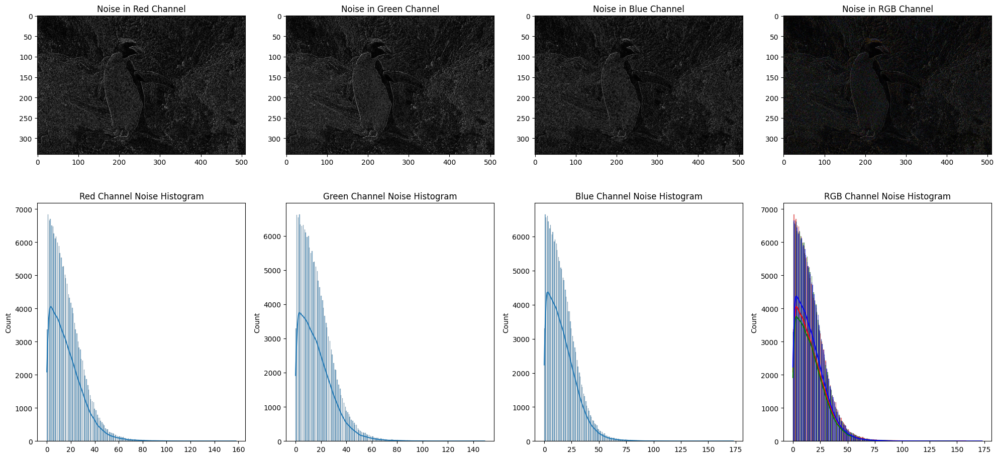

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


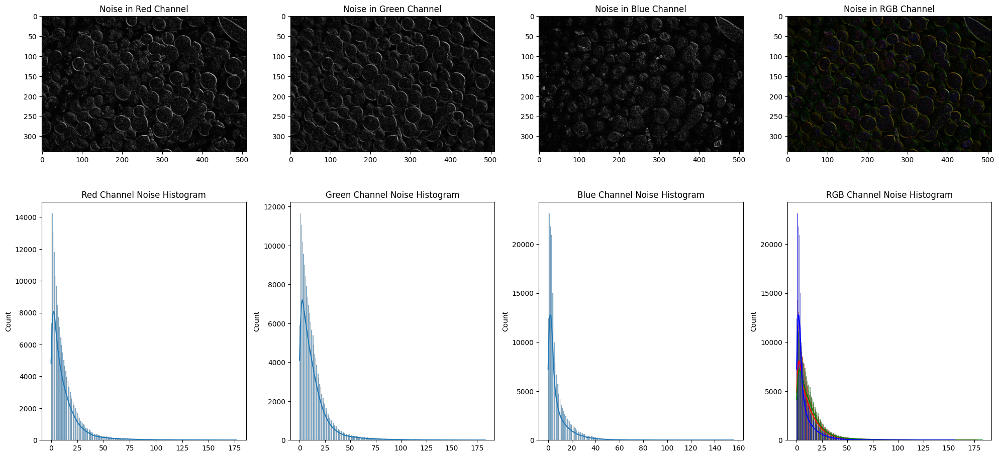

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


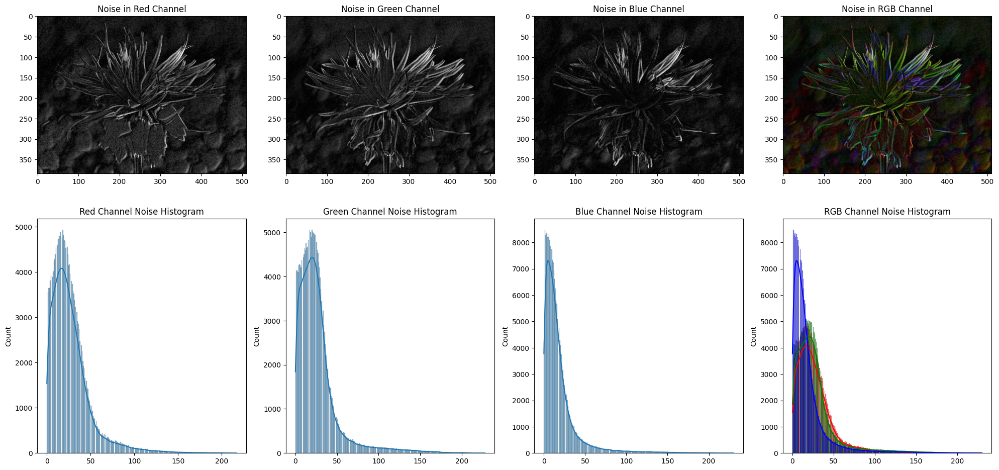

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


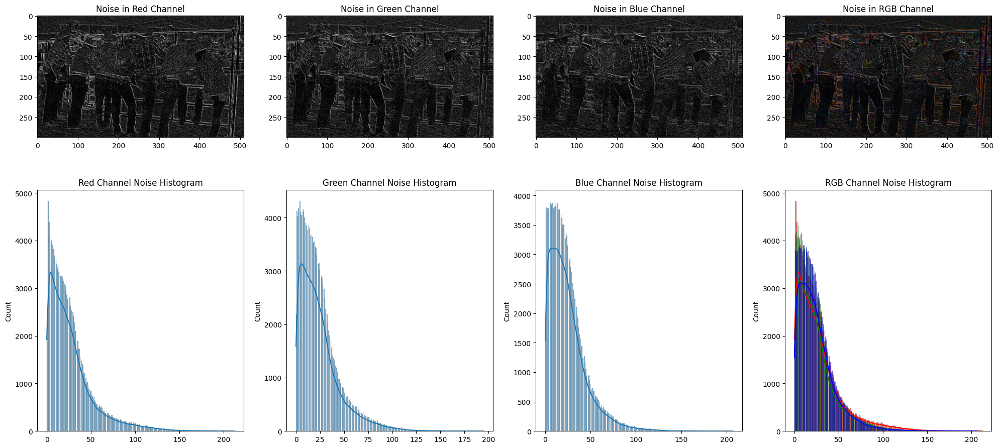

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


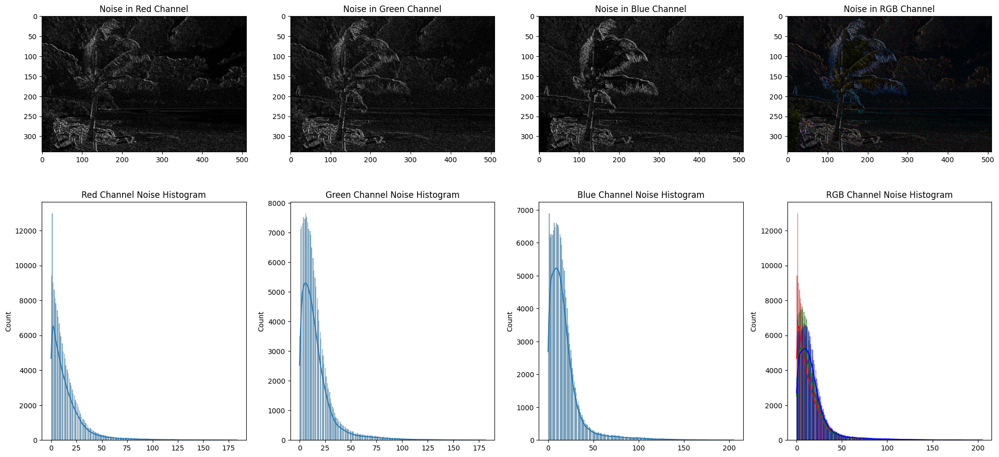

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


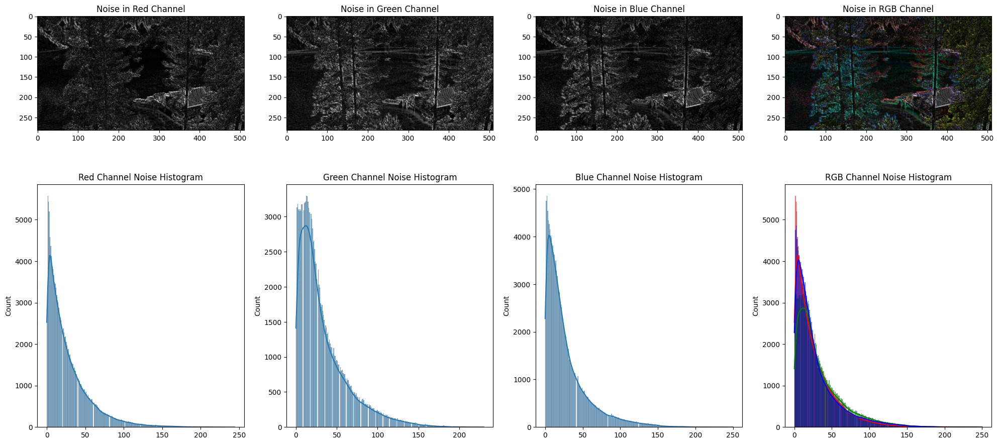

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


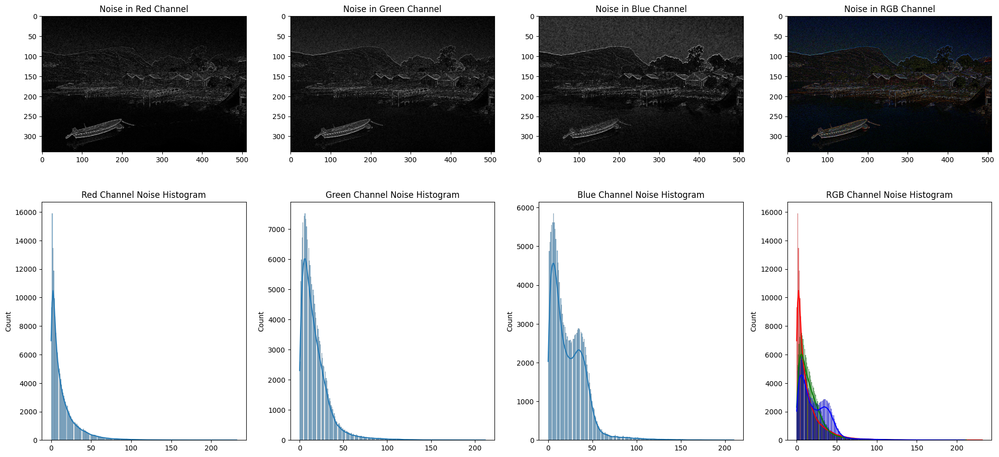

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


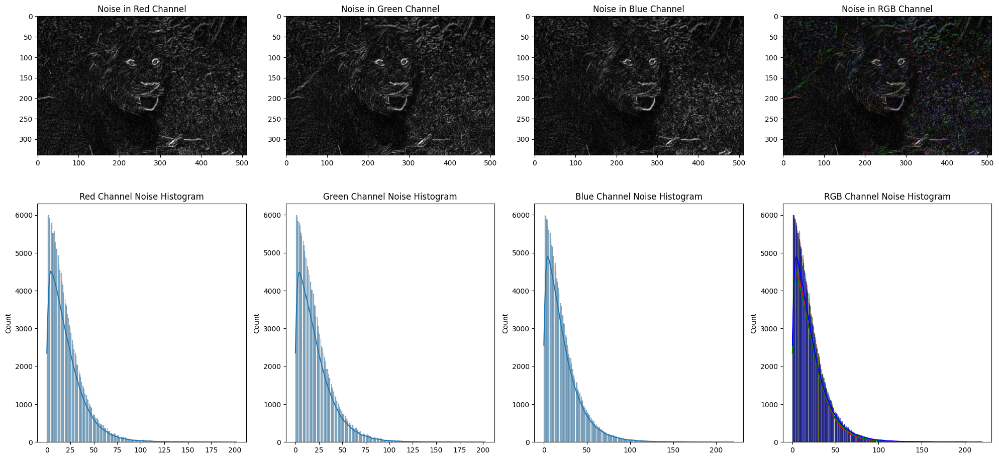

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


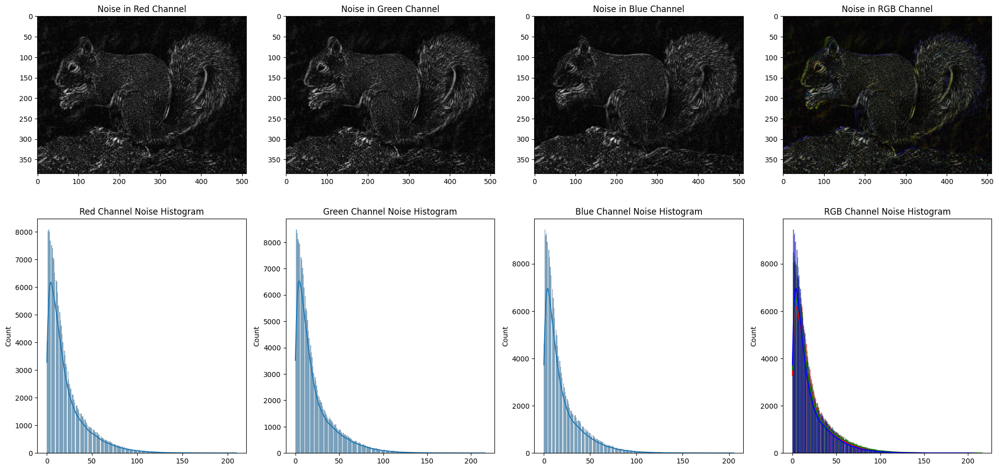

[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]


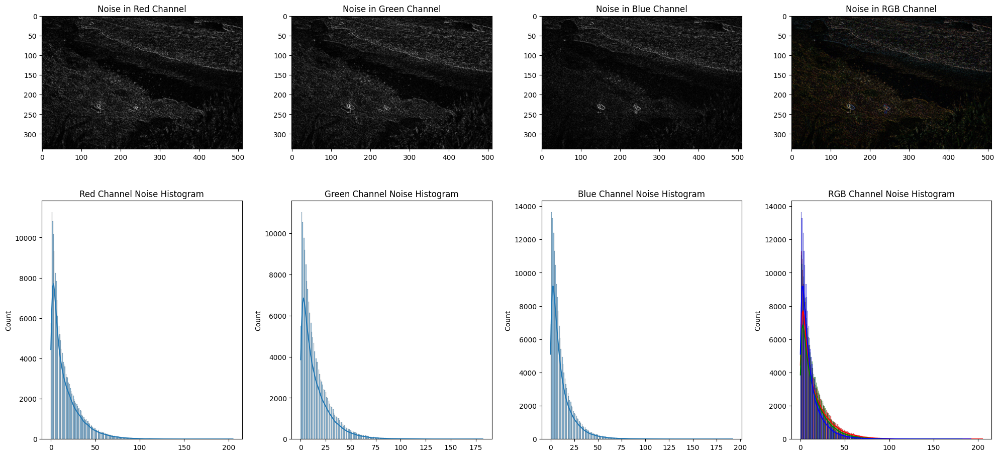

In [4]:
noise_diffs = []
for idx, (sample_hr_image, sample_lr_image) in tqdm(
    enumerate(zip(hr_images, lr_images)), total=len(hr_images)
):
    sample_hr_image = cv2.resize(
        sample_hr_image, (sample_lr_image.shape[1], sample_lr_image.shape[0])
    )

    diff = cv2.absdiff(sample_hr_image, sample_lr_image)
    noise_diffs.append(diff)


for idx, noise_diff in enumerate(noise_diffs):
    r, g, b = cv2.split(noise_diff)
    plt.rcParams["figure.figsize"] = (20, 10)
    fig, ax = plt.subplots(2, 4, figsize=(20, 10))
    print(ax)

    # channel-wise noise diffs
    ax[0][0].imshow(r, cmap="gray")
    ax[0][0].set_title("Noise in Red Channel")
    ax[0][1].imshow(g, cmap="gray")
    ax[0][1].set_title("Noise in Green Channel")
    ax[0][2].imshow(b, cmap="gray")
    ax[0][2].set_title("Noise in Blue Channel")
    ax[0][3].imshow(noise_diff, cmap="gray")
    ax[0][3].set_title("Noise in RGB Channel")

    # channel-wise noise histograms
    sns.histplot(r.ravel(), bins=256, kde=True, ax=ax[1][0])
    ax[1][0].set_title("Red Channel Noise Histogram")
    sns.histplot(g.ravel(), bins=256, kde=True, ax=ax[1][1])
    ax[1][1].set_title("Green Channel Noise Histogram")
    sns.histplot(b.ravel(), bins=256, kde=True, ax=ax[1][2])
    ax[1][2].set_title("Blue Channel Noise Histogram")
    sns.histplot(
        r.ravel(), bins=256, kde=True, color="red", label="Red Channel", ax=ax[1][3]
    )
    sns.histplot(
        g.ravel(), bins=256, kde=True, color="green", label="Green Channel", ax=ax[1][3]
    )
    sns.histplot(
        b.ravel(), bins=256, kde=True, color="blue", label="Blue Channel", ax=ax[1][3]
    )
    ax[1][3].set_title("RGB Channel Noise Histogram")

    #

    plt.tight_layout()
    plt.show()

# denoising ideas
- inverse filtering
- weiner filtering
- reguarlised
- constrained least square
- blind deconvolution
- lucy richardson
- total variation minimization
- non local mean denoising
- anistropic diffusion
- median filtering
- 